In [1]:
from sys import version
import tensorflow
import pandas as pd
import numpy as np
from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation
from keras.optimizers import SGD
from sklearn.preprocessing import StandardScaler, LabelEncoder, OneHotEncoder
from keras.callbacks import EarlyStopping
from os import makedirs
from keras.models import model_from_json

from matplotlib import pyplot as plt
plt.style.use('seaborn')
print(version)

Using TensorFlow backend.
3.6.2 |Anaconda custom (64-bit)| (default, Sep 21 2017, 18:29:43) 
[GCC 4.2.1 Compatible Clang 4.0.1 (tags/RELEASE_401/final)]


In [2]:
# load model
import pickle
with open("../models/final_nn/15m_column_labels.pkl", 'rb') as f:
    column_labels = pickle.load(f)
    
with open("../models/final_nn/model_15min.json") as f:
    model = model_from_json(f.read())
model.load_weights("../models/final_nn/model_15min_weights_train.h5")





Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.








In [3]:
weight_matrices = model.get_weights()
for m in weight_matrices:
    print(m.shape)
#0 (414, 1020) : each column's contribution to the neuron (pre-sigmoid)

#1 (1020,) : bias for the 1st layer. Not relative importance of each neuron, rather just a "volume adjustment" for each neuron.

#2 (1020, 1)  # each neuron's contribution to the linear output

#3 (1,): bias, kind of like the x intercept of the model.
# 7.2101936

(414, 1020)
(1020,)
(1020, 1)
(1,)


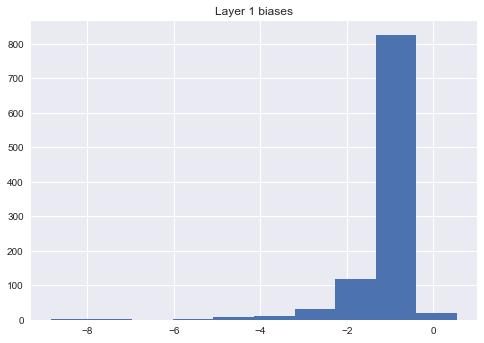

In [6]:
plt.hist(weight_matrices[1])
plt.title("Layer 1 biases")
plt.show()

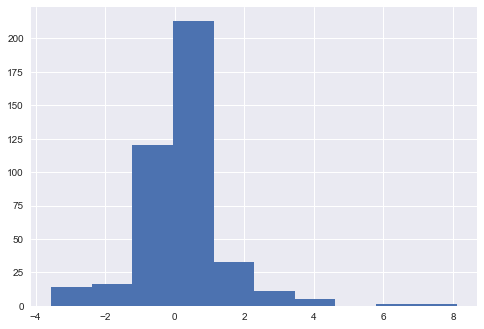

In [6]:
# Add the weights of each neuron to the bias term, ignoring the sigmoid for now
# Then multiply by the contribution to the output neuron
contributions = (weight_matrices[0] * weight_matrices[1]) * weight_matrices[2].squeeze()
col_contrib = contributions.mean(axis=1)
plt.hist(col_contrib)
plt.show()

In [49]:
# Which columns had the greatest positive and negative affects, in general?
sorted_idxs = np.argsort(col_contrib)
print("Top positive factors:")
for i in sorted_idxs[-20:][::-1]:
    print(f"{col_contrib[i]:.2f}\t{column_labels[i]}")
print('\n')
print("Top negative factors:")
for i in sorted_idxs[:20]:
    print(f"{col_contrib[i]:.2f}\t{column_labels[i]}")

Top positive factors:
8.12	Scaled: orca_total
5.96	is_weekend: 1.0
4.61	summer: False
4.36	is_ns: 1.0
3.81	is_ns: 0.0
3.58	summer: True
3.56	trip_start_hr_15: 00_0
3.30	day_of_week: 6
2.99	trip_start_hr_15: 22_45
2.90	region: South King County
2.86	trip_start_hr_15: 23_15
2.72	trip_start_hr_15: 23_0
2.67	day_of_week: 5
2.66	trip_start_hr_15: 22_15
2.59	trip_start_hr_15: 22_30
2.55	trip_start_hr_15: 21_45
2.42	dir: N
2.35	region: East King County
2.22	trip_start_hr_15: 00_15
2.20	is_weekend: 0.0


Top negative factors:
-3.55	trip_start_hr_15: 16_45
-3.14	trip_start_hr_15: 17_0
-3.10	trip_start_hr_15: 16_30
-3.07	trip_start_hr_15: 08_0
-2.96	trip_start_hr_15: 16_15
-2.71	trip_start_hr_15: 07_45
-2.71	trip_start_hr_15: 08_45
-2.70	trip_start_hr_15: 08_30
-2.63	trip_start_hr_15: 16_0
-2.61	trip_start_hr_15: 08_15
-2.59	trip_start_hr_15: 17_15
-2.44	trip_start_hr_15: 07_0
-2.43	trip_start_hr_15: 07_15
-2.42	trip_start_hr_15: 09_0
-2.33	trip_start_hr_15: 07_30
-2.09	trip_start_hr_15: 17_30
-

['is_weekend: 0.0', 'is_weekend: 1.0', 'trip_start_hr_15: 00_0', 'trip_start_hr_15: 00_15', 'trip_start_hr_15: 00_30', 'trip_start_hr_15: 00_45', 'trip_start_hr_15: 01_0', 'trip_start_hr_15: 01_15', 'trip_start_hr_15: 01_30', 'trip_start_hr_15: 01_45', 'trip_start_hr_15: 02_0', 'trip_start_hr_15: 02_15', 'trip_start_hr_15: 02_30', 'trip_start_hr_15: 02_45', 'trip_start_hr_15: 03_0', 'trip_start_hr_15: 03_15', 'trip_start_hr_15: 03_30', 'trip_start_hr_15: 03_45', 'trip_start_hr_15: 04_0', 'trip_start_hr_15: 04_15', 'trip_start_hr_15: 04_30', 'trip_start_hr_15: 04_45', 'trip_start_hr_15: 05_0', 'trip_start_hr_15: 05_15', 'trip_start_hr_15: 05_30', 'trip_start_hr_15: 05_45', 'trip_start_hr_15: 06_0', 'trip_start_hr_15: 06_15', 'trip_start_hr_15: 06_30', 'trip_start_hr_15: 06_45', 'trip_start_hr_15: 07_0', 'trip_start_hr_15: 07_15', 'trip_start_hr_15: 07_30', 'trip_start_hr_15: 07_45', 'trip_start_hr_15: 08_0', 'trip_start_hr_15: 08_15', 'trip_start_hr_15: 08_30', 'trip_start_hr_15: 08_45'

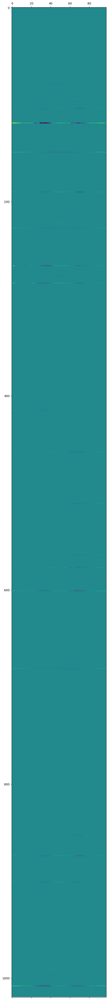

<Figure size 5000x6000 with 0 Axes>

In [27]:
# Were neurons generally focusing on time blocks?
trip_start_columns = list()
trip_start_colnames = list()
for i, lab in enumerate(column_labels):
    if lab.startswith('trip_start') or 'is_weekend' in lab:
        trip_start_columns.append(i)
        trip_start_colnames.append(lab)
trip_start_columns = np.array(trip_start_columns)
print(trip_start_colnames)

plt.style.use('default')
plt.figure(figsize=(50, 60))
plt.matshow(contributions[trip_start_columns,:].T, fignum=1)
plt.show()

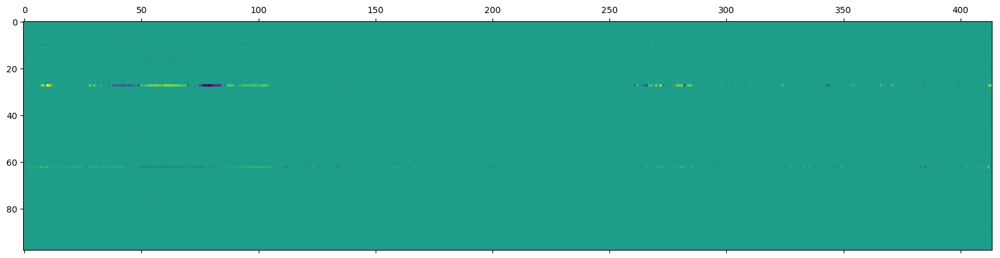

In [43]:
# Sort by neurons with the highest deivation from the overall mean
n2 = np.copy(contributions).T
n2 = n2[n2[trip_start_columns, :].std(axis=0).argsort(),:]

plt.style.use('default')
plt.figure(figsize=(20, 20))
plt.matshow(n2[trip_start_columns,:], fignum=1)
plt.show()

count    1020.000000
mean        8.115121
std       117.675674
min       -35.606419
25%        -0.769254
50%        -0.343531
75%        -0.172990
max      2339.431641
dtype: float64
(414, 1020)
(1020,)
(98,)
(1020,)


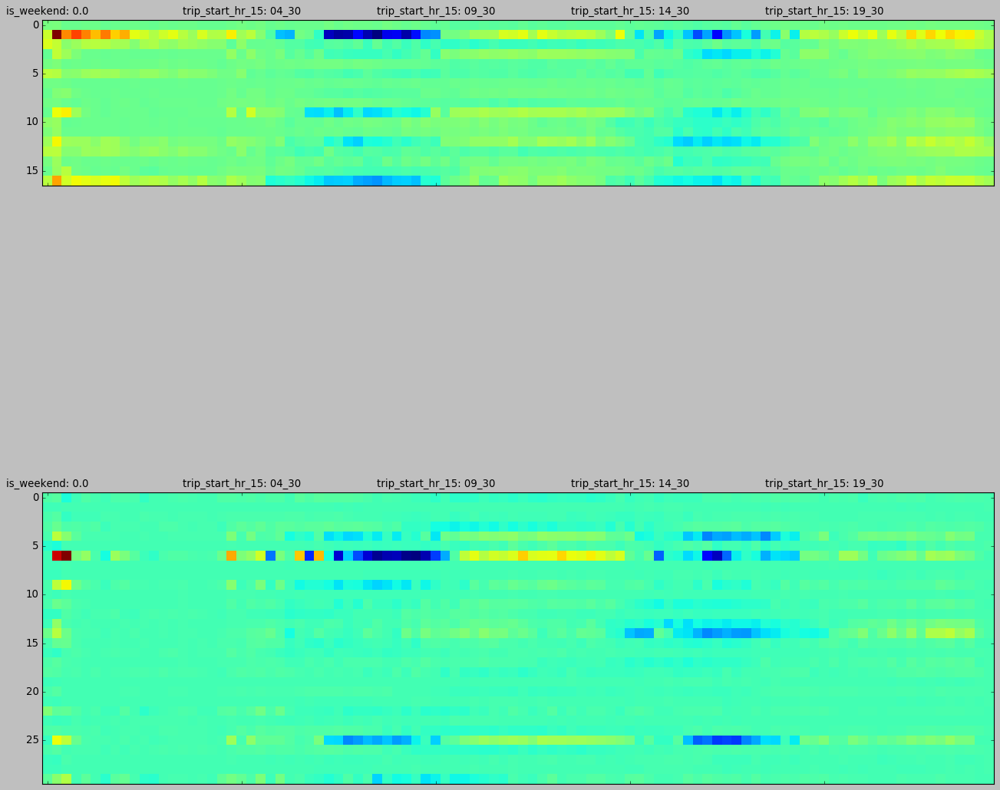

In [186]:
# Some neurons care a lot more about categorical data:

#print(pd.Series(contributions[trip_start_columns,:].sum(axis=0)).describe())
neuron_sums = contributions[trip_start_columns,:].sum(axis=0)
#is_categorical_neuron = (neuron_sums >= 20) | (neuron_sums <= -5)
is_categorical_neuron = (neuron_sums >= 50) | (neuron_sums <= -10)
print(pd.Series(contributions[0,:]).describe())
is_weekend = contributions[1,:] > 10
print(contributions.shape)
print(is_weekend.shape)
print(trip_start_columns.shape)
print(is_categorical_neuron.shape)
plt.style.use('classic')
#plt.figure(figsize=(30, 10))

ticks, labels = list(), ['']
for i in range(0, len(trip_start_colnames), 20):
    ticks.append(i)
    labels.append(trip_start_colnames[i])

fig, ax = plt.subplots(2,1, figsize=(20, 20))
ax[0].set_xticks(range(len(labels)+1))
ax[0].set_xticklabels(labels)
ax[0].matshow(contributions[trip_start_columns,][:,is_categorical_neuron & is_weekend].T)
#ax.tick_params(top=True, bottom=False,labeltop=True, labelbottom=False)
#plt.setp(ax.get_xticklabels(), rotation=-30, ha="right",rotation_mode="anchor")

ax[1].set_xticks(range(len(labels)+1))
ax[1].set_xticklabels(labels)
ax[1].matshow(contributions[trip_start_columns,][:,is_categorical_neuron & (~is_weekend)].T)
plt.show()

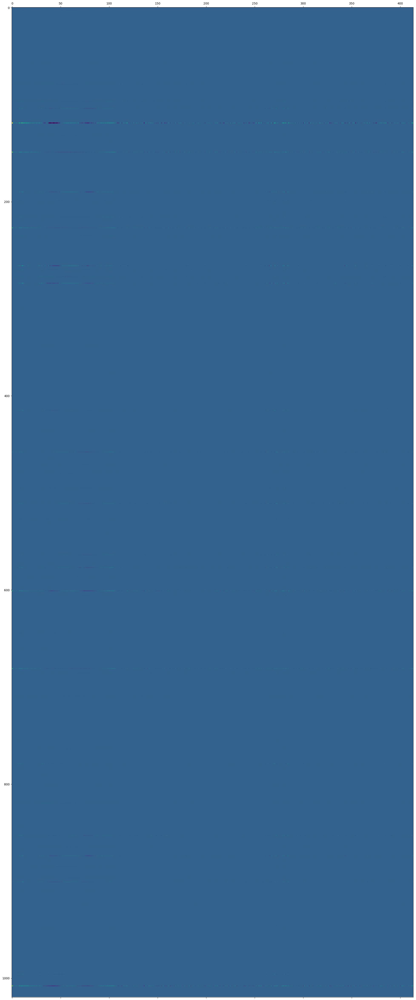

In [106]:

plt.style.use('default')
plt.figure(figsize=(50, 60))
plt.matshow(contributions.T, fignum=1)
plt.show()

In [140]:
column_labels

['Scaled: orca_total',
 'Scaled: frac_disabled',
 'Scaled: frac_youth',
 'Scaled: frac_senior',
 'Scaled: frac_li',
 'Scaled: frac_uw',
 'Scaled: hour',
 'is_ns: 0.0',
 'is_ns: 1.0',
 'is_weekend: 0.0',
 'is_weekend: 1.0',
 'trip_start_hr_15: 00_0',
 'trip_start_hr_15: 00_15',
 'trip_start_hr_15: 00_30',
 'trip_start_hr_15: 00_45',
 'trip_start_hr_15: 01_0',
 'trip_start_hr_15: 01_15',
 'trip_start_hr_15: 01_30',
 'trip_start_hr_15: 01_45',
 'trip_start_hr_15: 02_0',
 'trip_start_hr_15: 02_15',
 'trip_start_hr_15: 02_30',
 'trip_start_hr_15: 02_45',
 'trip_start_hr_15: 03_0',
 'trip_start_hr_15: 03_15',
 'trip_start_hr_15: 03_30',
 'trip_start_hr_15: 03_45',
 'trip_start_hr_15: 04_0',
 'trip_start_hr_15: 04_15',
 'trip_start_hr_15: 04_30',
 'trip_start_hr_15: 04_45',
 'trip_start_hr_15: 05_0',
 'trip_start_hr_15: 05_15',
 'trip_start_hr_15: 05_30',
 'trip_start_hr_15: 05_45',
 'trip_start_hr_15: 06_0',
 'trip_start_hr_15: 06_15',
 'trip_start_hr_15: 06_30',
 'trip_start_hr_15: 06_45',


In [21]:
# How much did the top N inputs contribute to each neuron?
feature_weights = weight_matrices[0]
top_n = list()
column_names = np.array(column_labels)

for i in weight_matrices[2][:,0].argsort()[:10]:
    weights = feature_weights[:,i]
    print(" weight: " + column_names[weights.argmax()])
    print("Min weight: " + column_names[weights.argmin()])

top_n = np.array(top_n).T.squeeze()
print(top_n.shape)

weight: rte: 125
Min weight: num: orca_total
 weight: num: frac_senior
Min weight: num: orca_total
 weight: num: frac_disabled
Min weight: num: frac_li
 weight: num: frac_senior
Min weight: num: orca_total
 weight: num: frac_disabled
Min weight: is_rapid: 0.0
 weight: end: Kent Station
Min weight: summer: True
 weight: num: orca_total
Min weight: is_rapid: 0.0
 weight: num: frac_li
Min weight: is_rapid: 0.0
 weight: num: orca_total
Min weight: summer: True
 weight: rte: 7
Min weight: is_rapid: 0.0
(0,)


In [80]:
top_n[0].mean(),top_n[1].mean(),top_n[2].mean(),top_n[3].mean(),top_n[4].mean()

(2.8092992, 4.6183567, 6.228235, 7.7144685, 9.109418)

In [47]:
# Find correlations between inputs in neurons
weights = pd.DataFrame(contributions.T, columns = column_labels)
cors = weights.corr()

In [54]:
xs = list()
ys = list()
ps = list()

for i, x in enumerate(column_labels):
    for j, y in enumerate(column_labels):
        if x == y: continue 
        if x > y:
            tmp = y
            y = x
            x = tmp

        xs.append(x)
        ys.append(y)
        ps.append(cors[x][y])
       
        
c2 = pd.DataFrame({
    'x': xs,
    'y': ys,
    'r': ps
}).drop_duplicates()
c2['abs_r'] = c2['r'].abs()
c2 = c2.sort_values('abs_r', ascending=False)
c2.loc[c2['abs_r'] > 0.9]

,x,y,r,abs_r
3,Scaled: frac_disabled,Scaled: frac_li,0.993214,0.993214
322,Scaled: frac_disabled,start: North Mercer Island,0.991310,0.991310
91078,Scaled: orca_total,rte: 224,0.991225,0.991225
210,Scaled: frac_disabled,rte: 204,0.988622,0.988622
163114,Scaled: orca_total,end: Shorewood,0.988051,0.988051
133720,Scaled: orca_total,start: North Mercer Island,0.987939,0.987939
20,Scaled: frac_disabled,trip_start_hr_15: 02_30,0.987062,0.987062
396,Scaled: frac_disabled,end: South Mercer Island,0.986782,0.986782
69550,Scaled: orca_total,rte: 113,0.986506,0.986506
1654,Scaled: frac_li,Scaled: orca_total,0.984953,0.984953


In [56]:
# What was negatively correlated with orca?
c2.loc[c2['x']=='Scaled: orca_total'].sort_values('r')

,x,y,r,abs_r
95632,Scaled: orca_total,rte: 244,-0.970814,0.970814
86110,Scaled: orca_total,rte: 197,-0.966576,0.966576
154006,Scaled: orca_total,end: Lake Kathleen,-0.962083,0.962083
154420,Scaled: orca_total,end: Lake Meridian P&R,-0.962079,0.962079
67480,Scaled: orca_total,rte: 102,-0.960720,0.960720
78244,Scaled: orca_total,rte: 158,-0.959870,0.959870
69136,Scaled: orca_total,rte: 111,-0.958796,0.958796
102256,Scaled: orca_total,rte: 309,-0.955449,0.955449
144484,Scaled: orca_total,end: Cherry Hill,-0.950911,0.950911
65410,Scaled: orca_total,rte: 75,-0.934120,0.934120


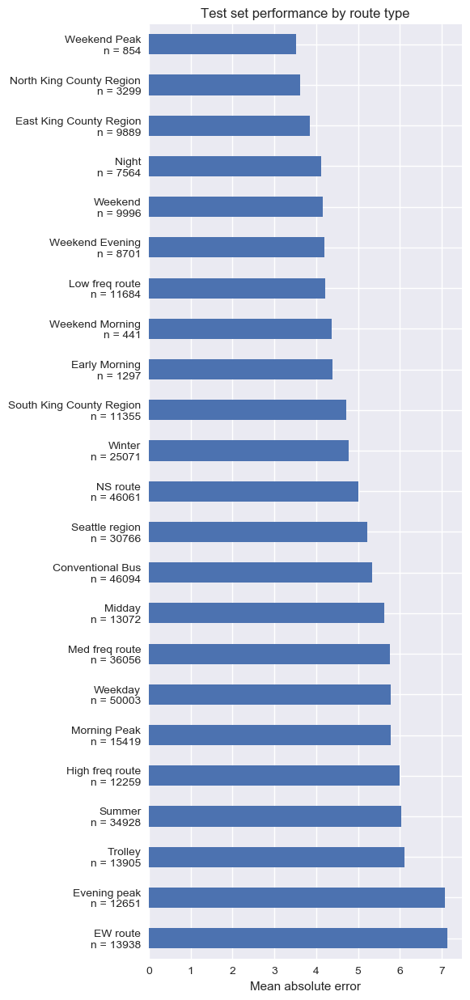

In [57]:
from matplotlib import pyplot as plt
plt.style.use('seaborn')
d = pd.read_csv("../evaluation/15m_test_group_perf.csv")
d['lab'] = d['group'].apply(str) + '\nn = ' + d['n'].apply(str)
d = d.set_index(['lab'])
plt.figure(figsize=(5,15))
d['mae'].plot.barh()
plt.title("Test set performance by route type")
plt.xlabel("Mean absolute error")
plt.ylabel("")
plt.show()

In [58]:
weights.head()

,Scaled: orca_total,Scaled: frac_disabled,Scaled: frac_youth,Scaled: frac_senior,Scaled: frac_li,Scaled: frac_uw,Scaled: hour,is_ns: 0.0,is_ns: 1.0,is_weekend: 0.0,...,end: Tahlequah Ferry Terminal,end: Timberlane,end: Tukwila,end: Twin Lakes,end: University District,end: Unknown,end: Westwood Village,end: Woodinville,summer: False,summer: True
0,-0.125221,-0.010554,0.005203,-0.008895,-0.008939,0.010085,-0.008744,0.101223,0.171257,0.188863,...,0.019620,0.007666,0.004840,0.014301,0.056517,-0.002958,-0.032579,0.006388,0.081420,0.176459
1,-0.250007,-0.003007,-0.019104,-0.013911,-0.022709,0.014970,-0.183286,0.280177,0.139864,0.264689,...,0.002153,0.017122,0.016987,0.046159,0.117308,-0.011216,-0.067062,0.018239,0.192399,0.240404
2,-0.131505,-0.010030,-0.002575,-0.016127,-0.016728,-0.015164,0.028946,0.074647,0.137767,0.152367,...,0.002914,-0.015706,0.007952,-0.012184,0.028345,0.015788,0.001876,0.025692,0.110416,0.133302
3,-4.437139,-0.900501,5.401143,2.440420,6.458289,7.464507,-0.741136,13.956024,23.442181,13.647957,...,1.677842,1.543435,-19.320095,4.584727,1.981375,0.791807,-10.213110,11.364361,19.231134,17.269108
4,-0.647204,-0.144532,-0.037629,0.075518,-0.054567,-0.056201,-0.025814,-0.239603,-0.278355,-0.483157,...,0.052328,-0.028924,-0.061895,0.057246,-0.128030,0.002276,0.002306,-0.038243,-0.199003,-0.302740


In [71]:
from sklearn.decomposition import PCA
# What are the top factors?
pca2 = PCA(5)
results = pca2.fit_transform(weights)

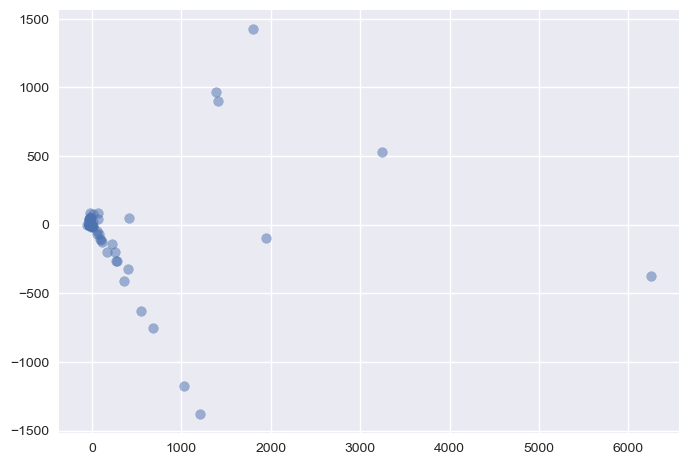

In [73]:
plt.scatter(results[:, 0], results[:, 1], alpha=0.5)
plt.show()

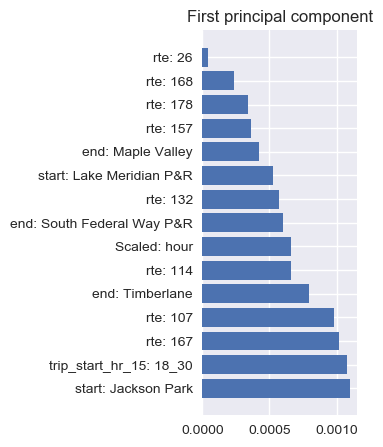

In [101]:
abs_vals = np.abs(pca2.components_[0])[np.argsort(np.abs(pca2.components_[0]))][:15][::-1]
names = np.array(column_labels)[np.argsort(np.abs(pca2.components_[0]))][:15][::-1]
plt.figure(figsize=(2,5))
plt.title("First principal component")
plt.barh(names, abs_vals)
plt.show()

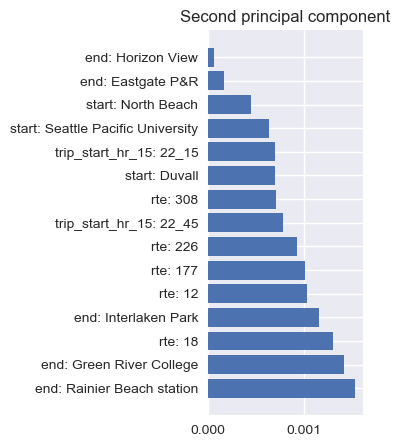

In [102]:
plt.figure(figsize=(2,5))
plt.title("Second principal component")
abs_vals = np.abs(pca2.components_[1])[np.argsort(np.abs(pca2.components_[1]))][:15][::-1]
names = np.array(column_labels)[np.argsort(np.abs(pca2.components_[1]))][:15][::-1]
plt.barh(names, abs_vals)
plt.show()

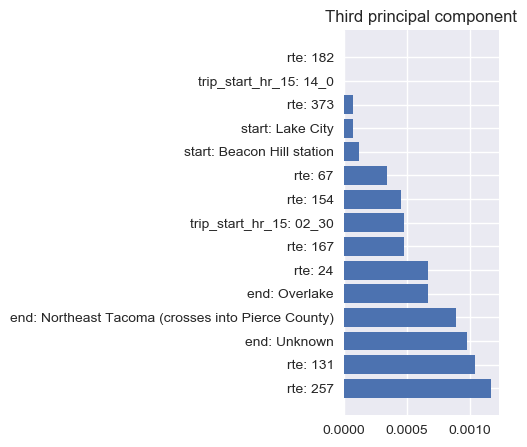

In [104]:
plt.figure(figsize=(2,5))
plt.title("Third principal component")
abs_vals = np.abs(pca2.components_[2])[np.argsort(np.abs(pca2.components_[2]))][:15][::-1]
names = np.array(column_labels)[np.argsort(np.abs(pca2.components_[2]))][:15][::-1]
plt.barh(names, abs_vals)
plt.show()

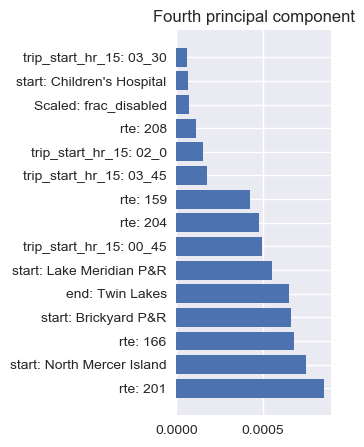

In [105]:
plt.figure(figsize=(2,5))
plt.title("Fourth principal component")
abs_vals = np.abs(pca2.components_[3])[np.argsort(np.abs(pca2.components_[3]))][:15][::-1]
names = np.array(column_labels)[np.argsort(np.abs(pca2.components_[3]))][:15][::-1]
plt.barh(names, abs_vals)
plt.show()

2
5
8
10
12
20


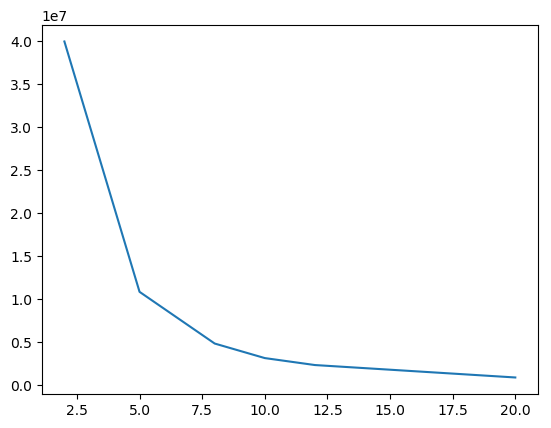

In [116]:
# clusters based on pca
from sklearn.cluster import KMeans
inertias = list()
for k in (2,5,8,10,12,20):
    print(k)
    km = KMeans(k)
    result = km.fit(weights)
    inertias.append(km.inertia_)

plt.plot((2,5,8,10,12,20), inertias)
plt.show()

In [121]:
# 10 clusters:
km = KMeans(10)
km.fit(weights)
km.__dict__

{'algorithm': 'auto',
 'cluster_centers_': array([[-6.8482685e-01,  6.5331459e-02,  4.7387898e-02, ...,
          7.3550813e-02,  8.1479859e-01,  3.5081768e-01],
        [ 1.6561323e+03,  1.7119766e+02,  8.5791801e+01, ...,
          4.9386997e+01,  4.1975845e+02,  4.0378171e+02],
        [ 2.3394316e+03,  2.4946342e+02,  1.8597134e+02, ...,
         -6.8502777e+01,  7.3111139e+02,  7.5541638e+02],
        ...,
        [-1.5752210e+01,  5.5988770e+00,  4.1751981e+00, ...,
         -4.9711258e+01,  3.1014059e+02,  1.5942130e+02],
        [ 4.2166214e+01,  1.4669643e+01,  1.0874757e+01, ...,
         -2.6035200e+01,  1.2547462e+02,  5.0338360e+01],
        [ 1.1198687e+01,  9.9013700e+00,  7.1628261e+00, ...,
         -5.9376569e+00,  5.7429886e+01,  5.7892193e+01]], dtype=float32),
 'copy_x': True,
 'inertia_': 3095861.1384281362,
 'init': 'k-means++',
 'labels_': array([0, 0, 0, ..., 0, 0, 0], dtype=int32),
 'max_iter': 300,
 'n_clusters': 10,
 'n_init': 10,
 'n_iter_': 3,
 'n_jobs': N

In [143]:
# Route number columns
is_route = np.array(['rte: ' in c for c in column_labels])

# Route start columns
is_rte_start = np.array(['start: ' in c for c in column_labels])

# Route end columns
is_rte_end = np.array(['end: ' in c for c in column_labels])

# Route region
is_region = np.array(['region: ' in c for c in column_labels])

# Day of week
is_day_of_wk = np.array(['day_of_week: ' in c for c in column_labels])

# Time of day columns
is_tod = np.array(['trip_start_: ' in c for c in column_labels])

cat_means = pd.DataFrame({
    'route_mean': weights.loc[:, is_route].mean(axis=1),
    'rte_start': weights.loc[:, is_rte_start].mean(axis=1),
    'rte_end': weights.loc[:, is_rte_end].mean(axis=1),
    'region': weights.loc[:, is_region].mean(axis=1),
    'day_of_wk': weights.loc[:, is_day_of_wk].mean(axis=1),
    'time_of_day': weights.loc[:, is_day_of_wk].mean(axis=1),
})

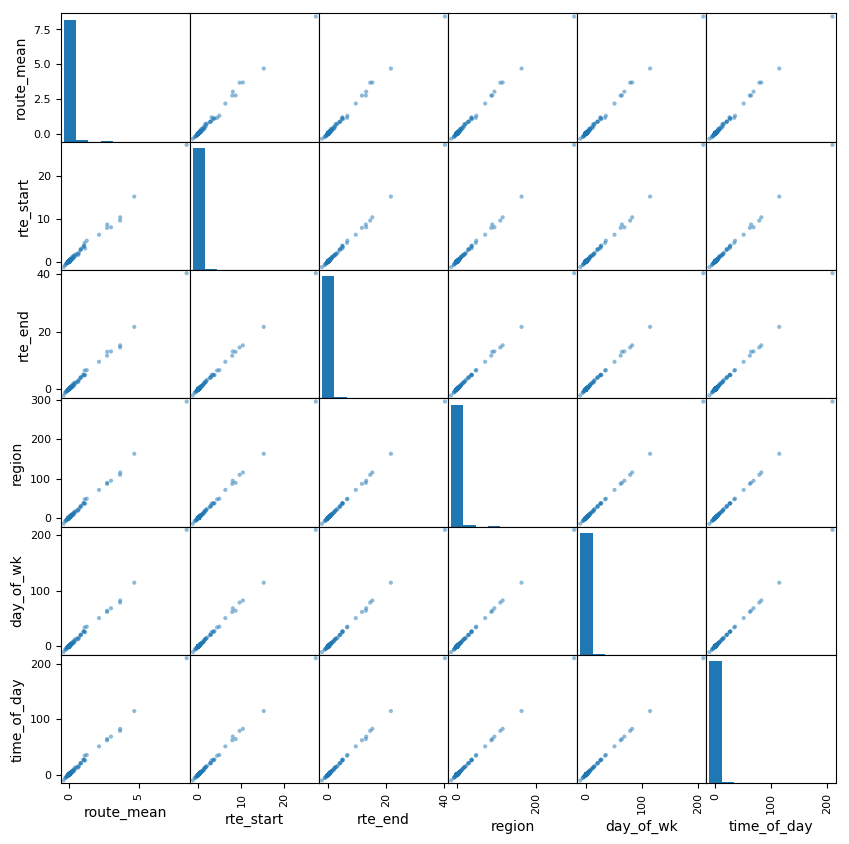

In [156]:
#cat_means.plot.scatter()
pd.plotting.scatter_matrix(cat_means, figsize=(10,10))
plt.show()

In [163]:
# Try the same with uncorrected weights


cat_means = pd.DataFrame({
    'route_num': weight_matrices[0][is_route].mean(axis=0),
    'rte_start': weight_matrices[0][is_rte_start].mean(axis=0),
    'rte_end': weight_matrices[0][is_rte_end].mean(axis=0),
    'region': weight_matrices[0][is_region].mean(axis=0),
    'day_of_wk': weight_matrices[0][is_day_of_wk].mean(axis=0),
    'time_of_day': weight_matrices[0][is_day_of_wk].mean(axis=0),
})

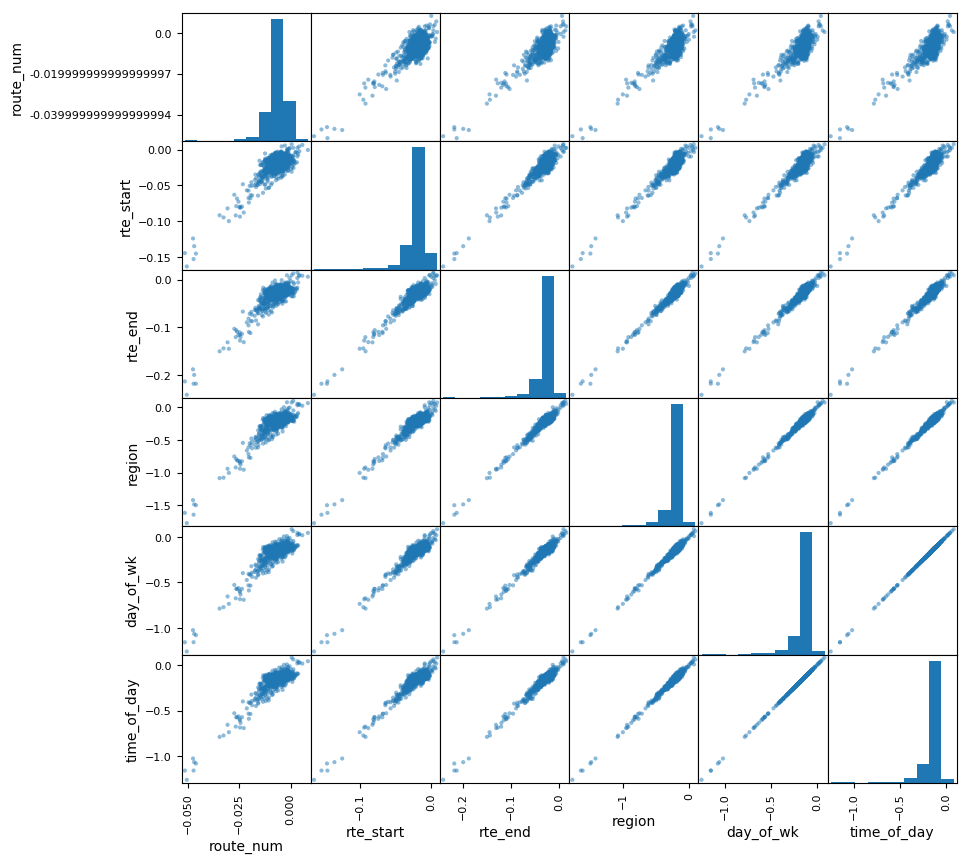

In [164]:
#cat_means.plot.scatter()
pd.plotting.scatter_matrix(cat_means, figsize=(10,10))
plt.show()

In [165]:
cat_means.corr()

,route_num,rte_start,rte_end,region,day_of_wk,time_of_day
route_num,1.000000,0.807217,0.839075,0.855764,0.852740,0.852740
rte_start,0.807217,1.000000,0.927403,0.937913,0.935654,0.935654
rte_end,0.839075,0.927403,1.000000,0.974246,0.972980,0.972980
region,0.855764,0.937913,0.974246,1.000000,0.988437,0.988437
day_of_wk,0.852740,0.935654,0.972980,0.988437,1.000000,1.000000
time_of_day,0.852740,0.935654,0.972980,0.988437,1.000000,1.000000
